In [1]:
import os
import random
import warnings
import numpy as np
import json
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image
from tqdm import tqdm
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import AutoImageProcessor, DeformableDetrForObjectDetection
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

warnings.filterwarnings("ignore", message=".*copying from a non-meta parameter.*")
device = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "mps" if torch.mps.is_available() else "cpu"
)
print(device)

random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
torch.cuda.manual_seed(42)
torch.cuda.manual_seed_all(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

model_save_dir = "detr_models"
if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)

2025-04-27 20:36:10.301151: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745786170.519232      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745786170.582999      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


cuda


In [2]:
class FoggyCityscapesDataset(Dataset):
    def __init__(self, root, annotations_path, processor):
        self.root = root
        self.coco_annotations = COCO(annotations_path)
        self.processor = processor
        self.img_ids = list(self.coco_annotations.imgs.keys())
        self.img_to_path = {
            id: os.path.join(root, self.coco_annotations.loadImgs(id)[0]["file_name"])
            for id in self.img_ids
        }

    def __len__(self):
        return len(self.img_ids)

    def __getitem__(self, idx):
        image_id = self.img_ids[idx]
        path = self.img_to_path[image_id]
        image = np.array(Image.open(path).convert("RGB"))
        processed = {}
        processed["image_id"] = image_id
        processed["orig_image"] = image
        processed["processed_img"] = self.processor(
            images=np.array(image), return_tensors="pt"
        )["pixel_values"].squeeze(0)

        return processed

In [3]:
def plot_predictions(orig_image, gt, output, id_to_cat):
    orig_image_cpu = orig_image.detach().cpu()

    fig, axs = plt.subplots(3, 1, figsize=(8, 12))
    axs[0].imshow(orig_image_cpu)
    axs[0].set_title("Original Image")
    axs[0].axis("off")

    axs[1].imshow(orig_image_cpu)
    axs[1].set_title("Ground Truth Boxes")
    axs[1].axis("off")
    for label, box in zip(gt["labels"], gt["boxes"]):
        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            linewidth=2,
            edgecolor="green",
            facecolor="none",
        )
        axs[1].add_patch(rect)
        axs[1].text(
            xmin,
            ymin - 5,
            f"GT: {id_to_cat[label]}",
            fontsize=10,
            color="blue",
            bbox=dict(facecolor="white", alpha=0.5),
        )

    axs[2].imshow(orig_image)
    axs[2].set_title("Predicted Boxes")
    axs[2].axis("off")

    for score, label, box in zip(output["scores"], output["labels"], output["boxes"]):
        score = score.detach().cpu()
        label = label.detach().cpu()
        box = box.detach().cpu()

        xmin, ymin, xmax, ymax = box
        rect = patches.Rectangle(
            (xmin, ymin),
            xmax - xmin,
            ymax - ymin,
            linewidth=2,
            edgecolor="red",
            facecolor="none",
        )
        axs[2].add_patch(rect)
        axs[2].text(
            xmin,
            ymin - 5,
            f"{id_to_cat[label.item()]}: {round(score.item(), 2)}",
            fontsize=10,
            color="red",
            bbox=dict(facecolor="white", alpha=0.5),
        )

    plt.tight_layout()
    plt.show()

In [4]:
def remap_and_filter_predictions(pred_dict, label_map):
    labels = pred_dict["labels"]
    keep_indices = torch.tensor(
        [i for i, label in enumerate(labels.tolist()) if label in label_map],
        device=labels.device,
        dtype=torch.long,
    )

    if keep_indices.numel() == 0:
        return {
            "scores": torch.empty(
                0, device=labels.device, dtype=pred_dict["scores"].dtype
            ),
            "labels": torch.empty(0, device=labels.device, dtype=torch.long),
            "boxes": torch.empty(
                (0, 4), device=labels.device, dtype=pred_dict["boxes"].dtype
            ),
        }

    filtered_scores = pred_dict["scores"][keep_indices]
    filtered_labels = pred_dict["labels"][keep_indices]
    filtered_boxes = pred_dict["boxes"][keep_indices]

    remapped_labels = torch.tensor(
        [label_map[int(label.item())] for label in filtered_labels],
        device=filtered_labels.device,
    )

    return {
        "scores": filtered_scores,
        "labels": remapped_labels,
        "boxes": filtered_boxes,
    }

In [5]:
def summarise_and_plot_metrics(coco, coco_dt, save_dir):
    coco_eval = COCOeval(coco, coco_dt, iouType="bbox")
    coco_eval.evaluate()
    coco_eval.accumulate()

    os.makedirs(save_dir, exist_ok=True)

    print("\n### COCO Evaluation Summary ###")
    coco_eval.summarize()

    overall_metrics = {
        "AP@[IoU=0.50:0.95]": coco_eval.stats[0],
        "AP@0.50": coco_eval.stats[1],
        "AP@0.75": coco_eval.stats[2],
        "AP (small)": coco_eval.stats[3],
        "AP (medium)": coco_eval.stats[4],
        "AP (large)": coco_eval.stats[5],
        "AR@1": coco_eval.stats[6],
        "AR@10": coco_eval.stats[7],
        "AR@100": coco_eval.stats[8],
        "AR (small)": coco_eval.stats[9],
        "AR (medium)": coco_eval.stats[10],
        "AR (large)": coco_eval.stats[11],
    }

    print("\n### Overall COCO Evaluation Metrics ###")
    for metric, value in overall_metrics.items():
        print(f"{metric:20s}: {value:.3f}")

    pd.DataFrame([overall_metrics]).to_csv(
        os.path.join(save_dir, "overall_metrics.csv"), index=False
    )

    precisions = coco_eval.eval["precision"]
    recall_vals = coco_eval.params.recThrs
    cat_ids = coco.getCatIds()

    full_metrics = []
    all_pr_tables = []
    overall_pr = []

    print("\n### Per-Class AP Metrics ###")
    for idx, catId in enumerate(cat_ids):
        class_metrics = {}
        cat_name = coco.loadCats(catId)[0]["name"]
        class_metrics["category"] = cat_name

        p50 = precisions[0, :, idx, 0, 2]
        p50 = p50[p50 > -1]
        class_metrics["AP@0.50"] = np.mean(p50) if p50.size else float("nan")

        p75 = precisions[5, :, idx, 0, 2]
        p75 = p75[p75 > -1]
        class_metrics["AP@0.75"] = np.mean(p75) if p75.size else float("nan")

        p_all = precisions[:, :, idx, 0, 2]
        p_all = p_all[p_all > -1]
        class_metrics["mAP@[.5:.95]"] = np.mean(p_all) if p_all.size else float("nan")

        full_metrics.append(class_metrics)

        print(
            f"{cat_name:20s} | AP@0.5: {class_metrics['AP@0.50']:.3f} | "
            f"AP@0.75: {class_metrics['AP@0.75']:.3f} | "
            f"mAP@[.5:.95]: {class_metrics['mAP@[.5:.95]']:.3f}"
        )

        pr_curve = precisions[0, :, idx, 0, 2]
        if np.any(pr_curve > -1):
            overall_pr.append(np.where(pr_curve == -1, 0, pr_curve))

        # Collect PR table data
        for r, p in zip(recall_vals, pr_curve):
            if p > -1:
                all_pr_tables.append(
                    {"category": cat_name, "recall": r, "precision": p}
                )

        # Plot PR curve for this class
        valid = pr_curve > -1
        plt.figure()
        plt.plot(
            recall_vals[valid],
            pr_curve[valid],
            label=f"PR Curve - {cat_name}",
            color="blue",
        )
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title(f"PR Curve @ IoU=0.5 for {cat_name}")
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(
            os.path.join(save_dir, f"pr_curve_{cat_name.replace(' ', '_')}.png")
        )
        plt.show()
        plt.close()

    # Save per-class metrics
    df_metrics = pd.DataFrame(full_metrics)
    df_metrics.to_csv(os.path.join(save_dir, "per_class_metrics.csv"), index=False)

    # Plot mAP per class bar chart
    plt.figure(figsize=(12, 6))
    plt.bar(df_metrics["category"], df_metrics["mAP@[.5:.95]"], color="skyblue")
    plt.xticks(rotation=45, ha="right")
    plt.ylabel("mAP@[.5:.95]")
    plt.title("Mean Average Precision per Class")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "mAP_per_class.png"))
    plt.show()
    plt.close()

    # Save full precision-recall table to CSV
    pr_df = pd.DataFrame(all_pr_tables)
    pr_df.to_csv(os.path.join(save_dir, "precision_recall_table.csv"), index=False)

    # Overall PR Curve
    if overall_pr:
        overall_pr_array = np.array(overall_pr)
        mean_pr_curve = np.mean(overall_pr_array, axis=0)

        # Plot overall PR curve
        plt.figure(figsize=(8, 6))
        plt.plot(
            recall_vals,
            mean_pr_curve,
            color="darkorange",
            label="Overall PR Curve (IoU=0.5)",
        )
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title("Overall Precision-Recall Curve @ IoU=0.5")
        plt.grid(True)
        plt.legend()
        plt.tight_layout()
        plt.savefig(os.path.join(save_dir, "overall_pr_curve.png"))
        plt.show()
        plt.close()

        # Plot PR curves for all classes in one figure
        plt.figure(figsize=(10, 7))
        for idx, pr_curve in enumerate(overall_pr_array):
            cat_name = coco.loadCats(cat_ids[idx])[0]["name"]
            valid = pr_curve > -1
            plt.plot(recall_vals[valid], pr_curve[valid], label=cat_name, linewidth=1.5)
        plt.xlabel("Recall")
        plt.ylabel("Precision")
        plt.title("PR Curves for All Classes @ IoU=0.5")
        plt.legend(
            loc="best", fontsize="small", bbox_to_anchor=(1.05, 1), borderaxespad=0.0
        )
        plt.grid(True)
        plt.tight_layout()
        plt.savefig(
            os.path.join(save_dir, "all_classes_pr_curve.png"), bbox_inches="tight"
        )
        plt.show()
        plt.close()

    # Plot AP@0.50 and AP@0.75 side-by-side per class
    plt.figure(figsize=(14, 6))
    x = np.arange(len(df_metrics))
    width = 0.35

    plt.bar(
        x - width / 2, df_metrics["AP@0.50"], width, label="AP@0.50", color="lightgreen"
    )
    plt.bar(
        x + width / 2, df_metrics["AP@0.75"], width, label="AP@0.75", color="salmon"
    )

    plt.xticks(ticks=x, labels=df_metrics["category"], rotation=45, ha="right")
    plt.ylabel("Average Precision")
    plt.title("AP@0.50 vs AP@0.75 per Class")
    plt.legend()
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "AP50_vs_AP75_per_class.png"))
    plt.show()
    plt.close()

    # Object-size AP bar chart
    size_ap_labels = ["small", "medium", "large"]
    size_ap_values = [
        overall_metrics["AP (small)"],
        overall_metrics["AP (medium)"],
        overall_metrics["AP (large)"],
    ]

    plt.figure(figsize=(6, 5))
    plt.bar(size_ap_labels, size_ap_values, color="orchid")
    plt.title("AP by Object Size")
    plt.ylabel("Average Precision")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "AP_by_object_size.png"))
    plt.show()
    plt.close()

    maxDets = ["AR@1", "AR@10", "AR@100"]
    ar_values = [
        overall_metrics["AR@1"],
        overall_metrics["AR@10"],
        overall_metrics["AR@100"],
    ]

    plt.figure(figsize=(6, 5))
    plt.plot(maxDets, ar_values, marker="o", linestyle="-", color="dodgerblue")
    plt.title("Average Recall vs Max Detections")
    plt.ylabel("Average Recall")
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "AR_vs_max_detections.png"))
    plt.show()
    plt.close()

    print("\n### Overall PR Curves at Multiple IoU Thresholds ###")

    iou_thresholds = coco_eval.params.iouThrs
    all_pr_curves = []

    plt.figure(figsize=(10, 6))

    for i, iou in enumerate(iou_thresholds):
        pr_iou = precisions[i, :, :, 0, 2]
        pr_iou = np.where(pr_iou == -1, 0, pr_iou)
        mean_pr = np.mean(pr_iou, axis=1)

        all_pr_curves.append(mean_pr)
        plt.plot(recall_vals, mean_pr, label=f"IoU={iou:.2f}", linewidth=1.5)

    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Overall PR Curves @ Varying IoU Thresholds")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.savefig(os.path.join(save_dir, "pr_curves_multiple_ious.png"))
    plt.show()
    plt.close()

In [6]:
def train(model, dataloader, val_loader, optimizer, id_to_cat, num_epochs):
    model_id_to_cat_id = {
        k: cat_id
        for k, cat_id in model.config.id2label.items()
        if cat_id in id_to_cat.values()
    }

    label_map = {}
    label_rev_map = {}

    for model_id, cat_name in model_id_to_cat_id.items():
        for cat_id, name in id_to_cat.items():
            if name == cat_name:
                label_map[int(model_id)] = cat_id
                label_rev_map[cat_id] = int(model_id)
                break

    coco = dataloader.dataset.coco_annotations
    val_coco = val_loader.dataset.coco_annotations

    epoch_losses = []
    epoch_ce_losses = []
    epoch_bbox_losses = []
    epoch_gen_iou_losses = []

    val_epoch_losses = []
    val_epoch_ce_losses = []
    val_epoch_bbox_losses = []
    val_epoch_gen_iou_losses = []

    for epoch in range(num_epochs):
        model.train()

        epoch_loss = 0.0
        epoch_ce_loss = 0.0
        epoch_bbox_loss = 0.0
        epoch_gen_iou_loss = 0.0

        print(f"\nEpoch {epoch + 1}/{num_epochs}")
        num_batches = len(dataloader)

        for batch in tqdm(dataloader, desc="Training"):
            processed_images = batch["processed_img"].to(device)
            image_ids = batch["image_id"]

            targets = []
            for i, image_id in enumerate(image_ids):
                h_orig, w_orig = batch["orig_image"][i].shape[:2]

                gt_annotations = coco.loadAnns(coco.getAnnIds(imgIds=image_id.item()))

                boxes = []
                labels = []

                for ann in gt_annotations:
                    x, y, w, h = ann["bbox"]
                    center_x = (x + w / 2) / w_orig
                    center_y = (y + h / 2) / h_orig
                    width = w / w_orig
                    height = h / h_orig

                    boxes.append([center_x, center_y, width, height])
                    labels.append(ann["category_id"])

                labels = [label_rev_map[i] for i in labels]

                if len(boxes) == 0:
                    boxes = [[0.5, 0.5, 1, 1]]
                    labels = [0]

                targets.append(
                    {
                        "boxes": torch.tensor(boxes, dtype=torch.float32).to(device),
                        "class_labels": torch.tensor(labels, dtype=torch.int64).to(
                            device
                        ),
                    }
                )

            outputs = model(pixel_values=processed_images, labels=targets)
            loss = outputs.loss
            loss_dict = outputs.loss_dict

            ce_loss = loss_dict["loss_ce"]
            bbox_loss = loss_dict["loss_bbox"]
            generalized_iou_loss = loss_dict["loss_giou"]

            epoch_loss += loss.item()
            epoch_ce_loss += ce_loss.item()
            epoch_bbox_loss += bbox_loss.item()
            epoch_gen_iou_loss += generalized_iou_loss.item()

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        epoch_loss /= num_batches
        epoch_ce_loss /= num_batches
        epoch_bbox_loss /= num_batches
        epoch_gen_iou_loss /= num_batches

        epoch_losses.append(epoch_loss)
        epoch_ce_losses.append(epoch_ce_loss)
        epoch_bbox_losses.append(epoch_bbox_loss)
        epoch_gen_iou_losses.append(epoch_gen_iou_loss)

        print(f"Epoch {epoch + 1} Train Loss: {epoch_loss:.4f}")

        model.eval()

        val_epoch_loss = 0.0
        val_ce_loss = 0.0
        val_bbox_loss = 0.0
        val_gen_iou_loss = 0.0

        val_num_batches = len(val_loader)

        with torch.no_grad():
            for batch in tqdm(val_loader, desc="Validation"):
                processed_images = batch["processed_img"].to(device)
                image_ids = batch["image_id"]

                targets = []
                for i, image_id in enumerate(image_ids):
                    h_orig, w_orig = batch["orig_image"][i].shape[:2]

                    gt_annotations = val_coco.loadAnns(
                        val_coco.getAnnIds(imgIds=image_id.item())
                    )

                    boxes = []
                    labels = []

                    for ann in gt_annotations:
                        x, y, w, h = ann["bbox"]
                        center_x = (x + w / 2) / w_orig
                        center_y = (y + h / 2) / h_orig
                        width = w / w_orig
                        height = h / h_orig

                        boxes.append([center_x, center_y, width, height])
                        labels.append(ann["category_id"])

                    labels = [label_rev_map[i] for i in labels]

                    if len(boxes) == 0:
                        boxes = [[0.5, 0.5, 1, 1]]
                        labels = [0]

                    targets.append(
                        {
                            "boxes": torch.tensor(boxes, dtype=torch.float32).to(
                                device
                            ),
                            "class_labels": torch.tensor(labels, dtype=torch.int64).to(
                                device
                            ),
                        }
                    )

                outputs = model(pixel_values=processed_images, labels=targets)
                loss = outputs.loss
                loss_dict = outputs.loss_dict

                ce_loss = loss_dict["loss_ce"]
                bbox_loss = loss_dict["loss_bbox"]
                generalized_iou_loss = loss_dict["loss_giou"]

                val_epoch_loss += loss.item()
                val_ce_loss += ce_loss.item()
                val_bbox_loss += bbox_loss.item()
                val_gen_iou_loss += generalized_iou_loss.item()

        val_epoch_loss /= val_num_batches
        val_ce_loss /= val_num_batches
        val_bbox_loss /= val_num_batches
        val_gen_iou_loss /= val_num_batches

        val_epoch_losses.append(val_epoch_loss)
        val_epoch_ce_losses.append(val_ce_loss)
        val_epoch_bbox_losses.append(val_bbox_loss)
        val_epoch_gen_iou_losses.append(val_gen_iou_loss)

        print(f"Epoch {epoch + 1} Validation Loss: {val_epoch_loss:.4f}")

        model_save_path = f"{model_save_dir}/model_epoch_{epoch + 1}.pth"
        model_save_path_one = f"{model_save_dir}/model.pth"

        torch.save(model.state_dict(), model_save_path)
        torch.save(model.state_dict(), model_save_path_one)
        print(f"Model saved at {model_save_path}")

    train_data = {
        "train_epoch_losses": epoch_losses,
        "train_classification_losses": epoch_ce_losses,
        "train_bounding_box_losses": epoch_bbox_losses,
        "train_generalized_iou_losses": epoch_gen_iou_losses,
        "val_epoch_losses": val_epoch_losses,
        "val_classification_losses": val_epoch_ce_losses,
        "val_bounding_box_losses": val_epoch_bbox_losses,
        "val_generalized_iou_losses": val_epoch_gen_iou_losses,
    }

    with open("train_data.json", "w") as f:
        json.dump(train_data, f)

    epochs = list(range(1, num_epochs + 1))

    def plot_loss(
        train_losses, val_losses, ylabel, title, filename, color_train, color_val
    ):
        plt.figure(figsize=(8, 6))
        plt.plot(epochs, train_losses, label="Train", color=color_train)
        plt.plot(epochs, val_losses, label="Validation", color=color_val)
        plt.xlabel("Epochs")
        plt.ylabel(ylabel)
        plt.title(title)
        plt.legend()
        plt.grid(True)
        plt.savefig(filename)
        plt.show()
        plt.close()

    plot_loss(
        epoch_ce_losses,
        val_epoch_ce_losses,
        "Classification Loss",
        "Classification Loss vs Epochs",
        "classification_loss_vs_epochs.png",
        "b",
        "c",
    )
    plot_loss(
        epoch_bbox_losses,
        val_epoch_bbox_losses,
        "Bounding Box Loss",
        "Bounding Box Loss vs Epochs",
        "bounding_box_loss_vs_epochs.png",
        "g",
        "lime",
    )
    plot_loss(
        epoch_gen_iou_losses,
        val_epoch_gen_iou_losses,
        "Generalized IoU Loss",
        "Generalized IoU Loss vs Epochs",
        "generalized_iou_loss_vs_epochs.png",
        "r",
        "salmon",
    )
    plot_loss(
        epoch_losses,
        val_epoch_losses,
        "Total Loss",
        "Total Loss vs Epochs",
        "total_loss_vs_epochs.png",
        "purple",
        "orchid",
    )

In [7]:
def inference(model, dataloader, processor, id_to_cat, save_path):
    coco = dataloader.dataset.coco_annotations

    model_id_to_cat_id = {
        k: cat_id
        for k, cat_id in model.config.id2label.items()
        if cat_id in id_to_cat.values()
    }

    label_map = {}
    for model_id, cat_name in model_id_to_cat_id.items():
        for cat_id, name in id_to_cat.items():
            if name == cat_name:
                label_map[int(model_id)] = cat_id
                break

    coco_predictions = []
    visualize = True
    num_visualize = 4
    num_visualize_done = 0

    for batch in tqdm(dataloader, desc="Running inference"):
        processed_images = batch["processed_img"].to(device)
        orig_images = batch["orig_image"]
        image_ids = batch["image_id"]

        pre_outputs = model(pixel_values=processed_images)

        postprocessed_outputs = processor.post_process_object_detection(
            pre_outputs,
            target_sizes=torch.tensor(
                [img.shape[:2] for img in orig_images], device=pre_outputs.logits.device
            ),
            threshold=0.5,
        )

        for i, image_id in enumerate(image_ids):
            output = postprocessed_outputs[i]
            output = remap_and_filter_predictions(output, label_map)

            for score, label, box in zip(
                output["scores"], output["labels"], output["boxes"]
            ):
                coco_predictions.append(
                    {
                        "image_id": int(image_id),
                        "category_id": int(label),
                        "bbox": [
                            float(box[0]),
                            float(box[1]),
                            float(box[2] - box[0]),
                            float(box[3] - box[1]),
                        ],
                        "score": float(score),
                    }
                )

            if visualize and num_visualize_done < num_visualize:
                num_visualize_done += 1
                gt_annotations = coco.loadAnns(coco.getAnnIds(imgIds=image_id.item()))

                if not gt_annotations:
                    continue

                # Format ground truth
                gt_labels = [ann["category_id"] for ann in gt_annotations]
                gt_boxes = [
                    [
                        ann["bbox"][0],
                        ann["bbox"][1],
                        ann["bbox"][0] + ann["bbox"][2],
                        ann["bbox"][1] + ann["bbox"][3],
                    ]
                    for ann in gt_annotations
                ]
                gt = {"labels": gt_labels, "boxes": gt_boxes}

                plot_predictions(orig_images[i], gt, output, id_to_cat)

    with open(save_path, "w") as f:
        json.dump(coco_predictions, f)

In [8]:
processor = AutoImageProcessor.from_pretrained("SenseTime/deformable-detr")
model = DeformableDetrForObjectDetection.from_pretrained("SenseTime/deformable-detr")
model = model.to(device)

for param in model.parameters():
    param.requires_grad = False

for param in model.model.decoder.parameters():
    param.requires_grad = True

for param in model.class_embed.parameters():
    param.requires_grad = True

for param in model.bbox_embed.parameters():
    param.requires_grad = True

for param in model.model.reference_points.parameters():
    param.requires_grad = True

preprocessor_config.json:   0%|          | 0.00/305 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


config.json:   0%|          | 0.00/4.54k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/161M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/102M [00:00<?, ?B/s]

Some weights of the model checkpoint at SenseTime/deformable-detr were not used when initializing DeformableDetrForObjectDetection: ['model.backbone.conv_encoder.model.layer1.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer2.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer3.0.downsample.1.num_batches_tracked', 'model.backbone.conv_encoder.model.layer4.0.downsample.1.num_batches_tracked']
- This IS expected if you are initializing DeformableDetrForObjectDetection from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing DeformableDetrForObjectDetection from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [9]:
train_dataset = FoggyCityscapesDataset(
    root="/kaggle/input/foggy-cityscapes/dataset/foggy_dataset_A3_train",
    annotations_path="/kaggle/input/foggy-cityscapes/dataset/annotations_train.json",
    processor=processor,
)

val_dataset = FoggyCityscapesDataset(
    root="/kaggle/input/foggy-cityscapes/dataset/foggy_dataset_A3_val",
    annotations_path="/kaggle/input/foggy-cityscapes/dataset/annotations_val.json",
    processor=processor,
)

loading annotations into memory...
Done (t=7.77s)
creating index...
index created!
loading annotations into memory...
Done (t=2.63s)
creating index...
index created!


In [10]:
train_loader = DataLoader(train_dataset, batch_size=2, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=2, shuffle=False)

In [11]:
train_coco_gt = train_dataset.coco_annotations
val_coco_gt = val_dataset.coco_annotations
valid_cat_ids = set(val_coco_gt.getCatIds())
categories = val_coco_gt.loadCats(valid_cat_ids)
id_to_cat = {cat["id"]: cat["name"] for cat in categories}
model.config.id2label[12] = "rider"
model.config.label2id["rider"] = 12

In [12]:
model_save_path_zero = f"{model_save_dir}/model_base.pth"
torch.save(model.state_dict(), model_save_path_zero)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5, weight_decay=1e-4)
num_epochs = 25


--- Training Phase ---

Epoch 1/25


Training: 100%|██████████| 1187/1187 [13:37<00:00,  1.45it/s]


Epoch 1 Train Loss: 1.3636


Validation: 100%|██████████| 301/301 [03:13<00:00,  1.56it/s]


Epoch 1 Validation Loss: 1.3009
Model saved at detr_models/model_epoch_1.pth

Epoch 2/25


Training: 100%|██████████| 1187/1187 [12:11<00:00,  1.62it/s]


Epoch 2 Train Loss: 1.3018


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.73it/s]


Epoch 2 Validation Loss: 1.2502
Model saved at detr_models/model_epoch_2.pth

Epoch 3/25


Training: 100%|██████████| 1187/1187 [12:11<00:00,  1.62it/s]


Epoch 3 Train Loss: 1.2587


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.72it/s]


Epoch 3 Validation Loss: 1.2239
Model saved at detr_models/model_epoch_3.pth

Epoch 4/25


Training: 100%|██████████| 1187/1187 [12:11<00:00,  1.62it/s]


Epoch 4 Train Loss: 1.2404


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.73it/s]


Epoch 4 Validation Loss: 1.2159
Model saved at detr_models/model_epoch_4.pth

Epoch 5/25


Training: 100%|██████████| 1187/1187 [12:09<00:00,  1.63it/s]


Epoch 5 Train Loss: 1.2321


Validation: 100%|██████████| 301/301 [02:53<00:00,  1.73it/s]


Epoch 5 Validation Loss: 1.2045
Model saved at detr_models/model_epoch_5.pth

Epoch 6/25


Training: 100%|██████████| 1187/1187 [12:10<00:00,  1.63it/s]


Epoch 6 Train Loss: 1.2232


Validation: 100%|██████████| 301/301 [02:53<00:00,  1.73it/s]


Epoch 6 Validation Loss: 1.1983
Model saved at detr_models/model_epoch_6.pth

Epoch 7/25


Training: 100%|██████████| 1187/1187 [12:15<00:00,  1.61it/s]


Epoch 7 Train Loss: 1.2115


Validation: 100%|██████████| 301/301 [02:56<00:00,  1.71it/s]


Epoch 7 Validation Loss: 1.1944
Model saved at detr_models/model_epoch_7.pth

Epoch 8/25


Training: 100%|██████████| 1187/1187 [12:15<00:00,  1.61it/s]


Epoch 8 Train Loss: 1.2054


Validation: 100%|██████████| 301/301 [02:57<00:00,  1.70it/s]


Epoch 8 Validation Loss: 1.1894
Model saved at detr_models/model_epoch_8.pth

Epoch 9/25


Training: 100%|██████████| 1187/1187 [12:15<00:00,  1.61it/s]


Epoch 9 Train Loss: 1.2011


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.72it/s]


Epoch 9 Validation Loss: 1.1861
Model saved at detr_models/model_epoch_9.pth

Epoch 10/25


Training: 100%|██████████| 1187/1187 [12:16<00:00,  1.61it/s]


Epoch 10 Train Loss: 1.1927


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.72it/s]


Epoch 10 Validation Loss: 1.1862
Model saved at detr_models/model_epoch_10.pth

Epoch 11/25


Training: 100%|██████████| 1187/1187 [12:14<00:00,  1.62it/s]


Epoch 11 Train Loss: 1.1875


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.72it/s]


Epoch 11 Validation Loss: 1.1809
Model saved at detr_models/model_epoch_11.pth

Epoch 12/25


Training: 100%|██████████| 1187/1187 [12:15<00:00,  1.61it/s]


Epoch 12 Train Loss: 1.1884


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.72it/s]


Epoch 12 Validation Loss: 1.1762
Model saved at detr_models/model_epoch_12.pth

Epoch 13/25


Training: 100%|██████████| 1187/1187 [12:15<00:00,  1.61it/s]


Epoch 13 Train Loss: 1.1809


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.72it/s]


Epoch 13 Validation Loss: 1.1740
Model saved at detr_models/model_epoch_13.pth

Epoch 14/25


Training: 100%|██████████| 1187/1187 [12:15<00:00,  1.61it/s]


Epoch 14 Train Loss: 1.1833


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.72it/s]


Epoch 14 Validation Loss: 1.1714
Model saved at detr_models/model_epoch_14.pth

Epoch 15/25


Training: 100%|██████████| 1187/1187 [12:15<00:00,  1.61it/s]


Epoch 15 Train Loss: 1.1775


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.73it/s]


Epoch 15 Validation Loss: 1.1678
Model saved at detr_models/model_epoch_15.pth

Epoch 16/25


Training: 100%|██████████| 1187/1187 [12:16<00:00,  1.61it/s]


Epoch 16 Train Loss: 1.1713


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.72it/s]


Epoch 16 Validation Loss: 1.1701
Model saved at detr_models/model_epoch_16.pth

Epoch 17/25


Training: 100%|██████████| 1187/1187 [12:15<00:00,  1.61it/s]


Epoch 17 Train Loss: 1.1708


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.71it/s]


Epoch 17 Validation Loss: 1.1698
Model saved at detr_models/model_epoch_17.pth

Epoch 18/25


Training: 100%|██████████| 1187/1187 [12:14<00:00,  1.62it/s]


Epoch 18 Train Loss: 1.1729


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.72it/s]


Epoch 18 Validation Loss: 1.1674
Model saved at detr_models/model_epoch_18.pth

Epoch 19/25


Training: 100%|██████████| 1187/1187 [12:13<00:00,  1.62it/s]


Epoch 19 Train Loss: 1.1641


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.72it/s]


Epoch 19 Validation Loss: 1.1638
Model saved at detr_models/model_epoch_19.pth

Epoch 20/25


Training: 100%|██████████| 1187/1187 [12:13<00:00,  1.62it/s]


Epoch 20 Train Loss: 1.1681


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.72it/s]


Epoch 20 Validation Loss: 1.1642
Model saved at detr_models/model_epoch_20.pth

Epoch 21/25


Training: 100%|██████████| 1187/1187 [12:15<00:00,  1.61it/s]


Epoch 21 Train Loss: 1.1628


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.72it/s]


Epoch 21 Validation Loss: 1.1614
Model saved at detr_models/model_epoch_21.pth

Epoch 22/25


Training: 100%|██████████| 1187/1187 [12:17<00:00,  1.61it/s]


Epoch 22 Train Loss: 1.1596


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.72it/s]


Epoch 22 Validation Loss: 1.1577
Model saved at detr_models/model_epoch_22.pth

Epoch 23/25


Training: 100%|██████████| 1187/1187 [12:15<00:00,  1.61it/s]


Epoch 23 Train Loss: 1.1553


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.72it/s]


Epoch 23 Validation Loss: 1.1599
Model saved at detr_models/model_epoch_23.pth

Epoch 24/25


Training: 100%|██████████| 1187/1187 [12:15<00:00,  1.61it/s]


Epoch 24 Train Loss: 1.1548


Validation: 100%|██████████| 301/301 [02:54<00:00,  1.72it/s]


Epoch 24 Validation Loss: 1.1554
Model saved at detr_models/model_epoch_24.pth

Epoch 25/25


Training: 100%|██████████| 1187/1187 [12:15<00:00,  1.61it/s]


Epoch 25 Train Loss: 1.1560


Validation: 100%|██████████| 301/301 [02:55<00:00,  1.72it/s]


Epoch 25 Validation Loss: 1.1555
Model saved at detr_models/model_epoch_25.pth


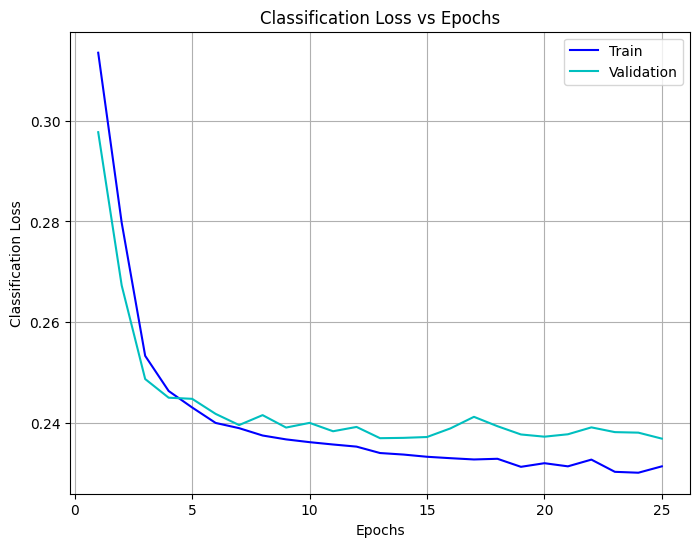

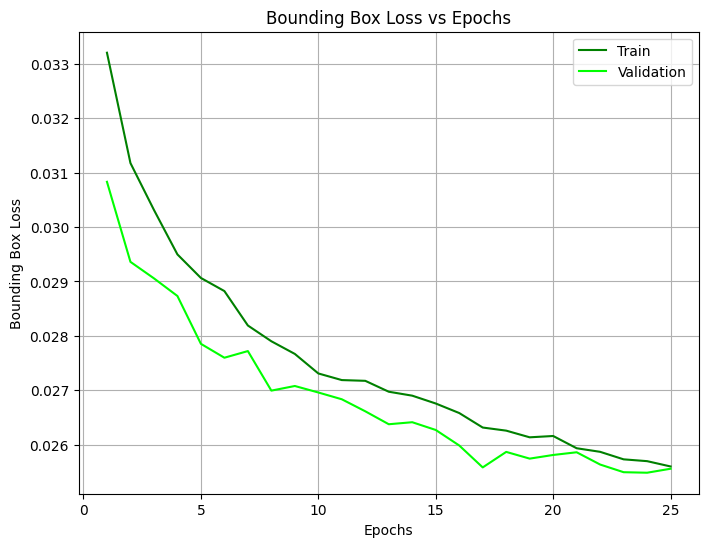

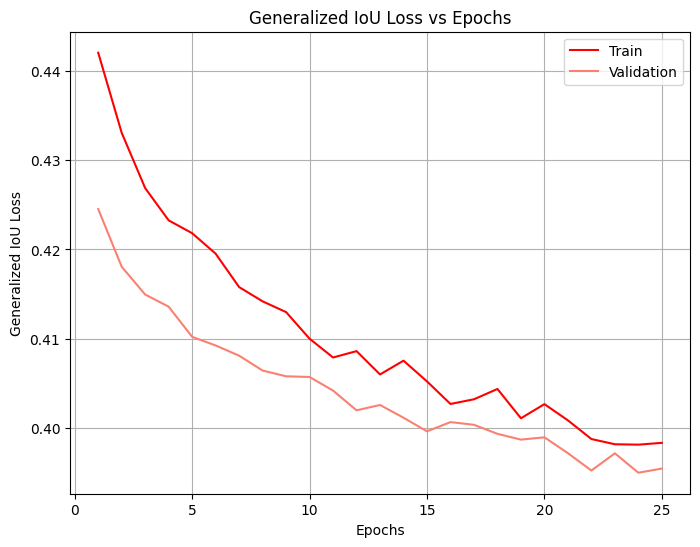

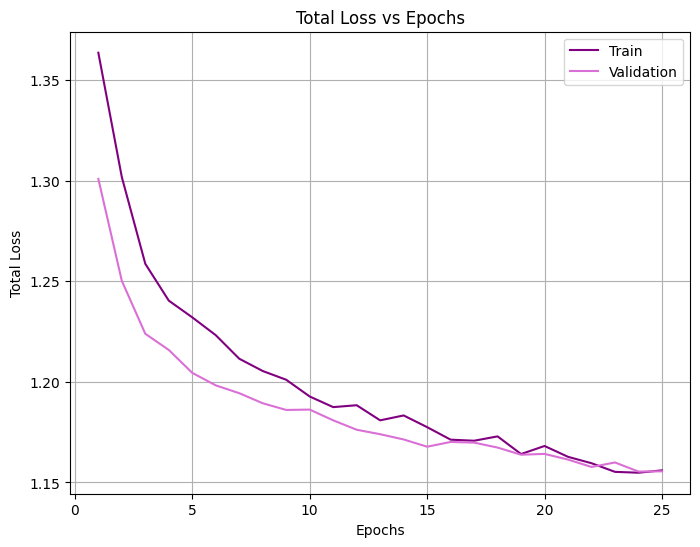

In [13]:
print("\n--- Training Phase ---")
train(model, train_loader, val_loader, optimizer, id_to_cat, num_epochs)

In [14]:
model_save_path_one = f"{model_save_dir}/model.pth"
model.load_state_dict(torch.load(model_save_path_one, map_location=device))
model = model.to(device)

/tmp/ipykernel_19/203308464.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(model_save_path_one, map_location=device))



--- Evaluating on training set ---


Running inference:   0%|          | 0/1187 [00:00<?, ?it/s]

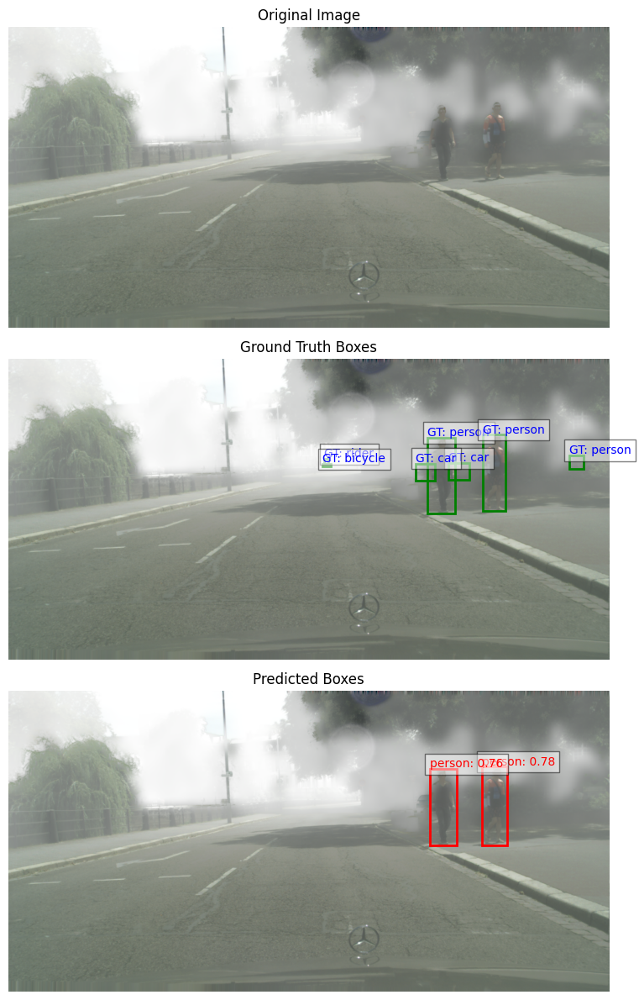

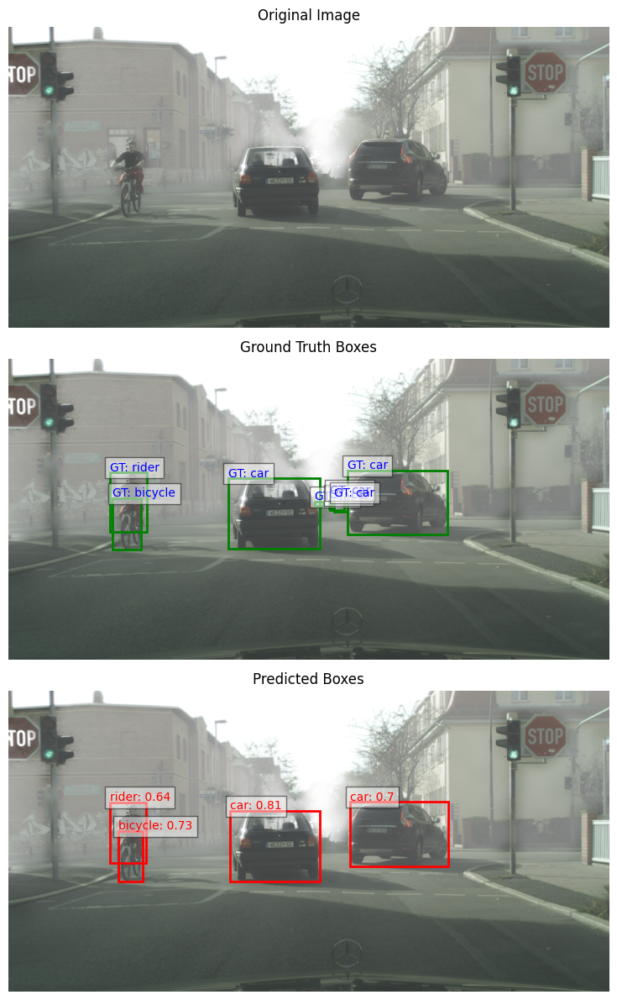

Running inference:   0%|          | 1/1187 [00:03<1:02:28,  3.16s/it]

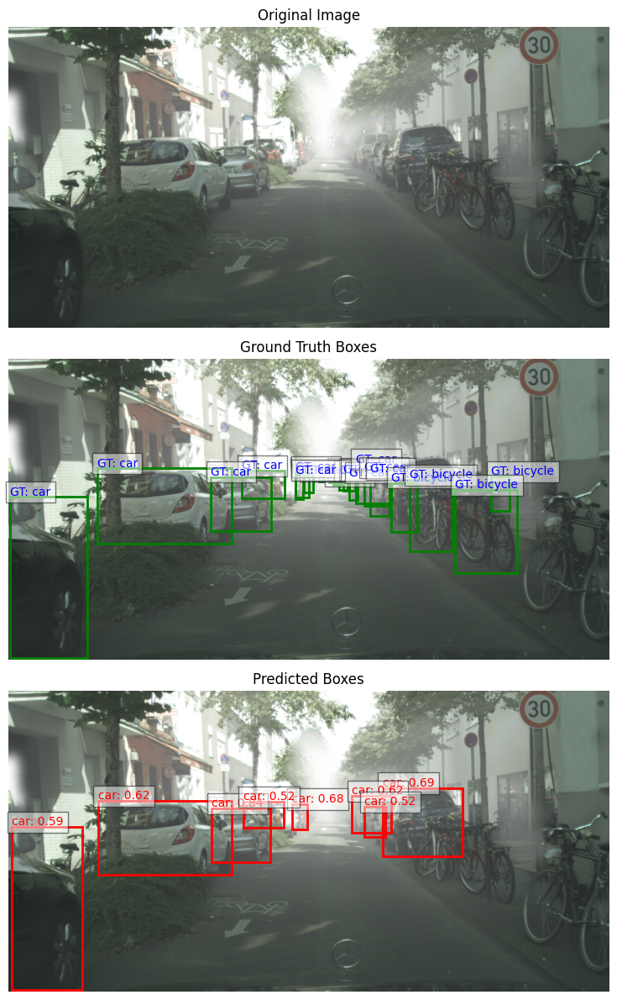

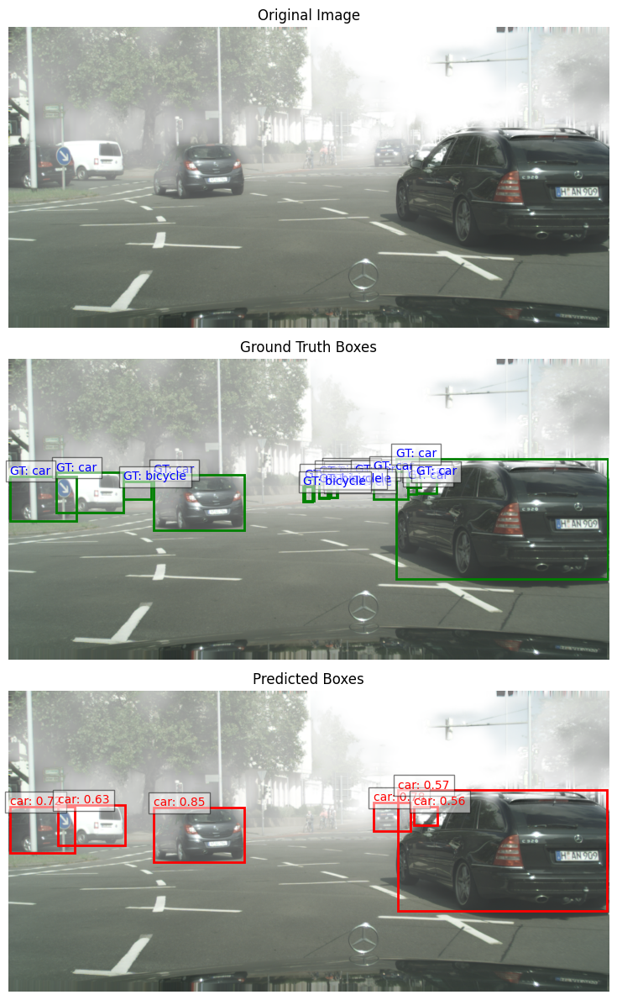

Running inference: 100%|██████████| 1187/1187 [11:37<00:00,  1.70it/s]


In [15]:
print("\n--- Evaluating on training set ---")
train_save_path = "train_predictions.json"
model.eval()
with torch.no_grad():
    train_eval = inference(model, train_loader, processor, id_to_cat, train_save_path)

Loading and preparing results...
DONE (t=0.05s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=6.03s).
Accumulating evaluation results...
DONE (t=0.55s).

### COCO Evaluation Summary ###
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.157
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.225
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.167
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.007
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.123
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.392
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.115
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.173
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.175
 Average Recall     (AR) @[ IoU=0.5

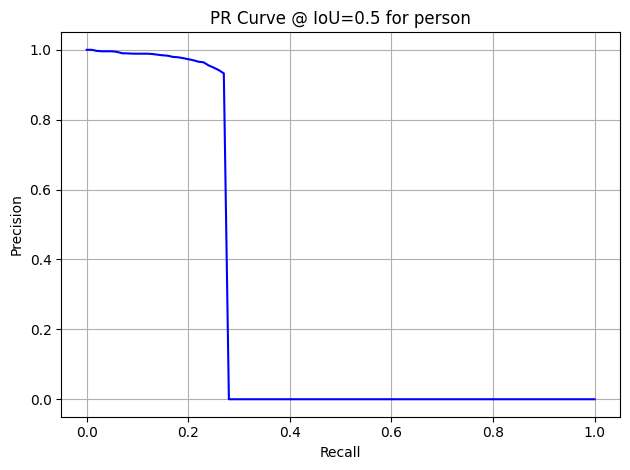

car                  | AP@0.5: 0.429 | AP@0.75: 0.363 | mAP@[.5:.95]: 0.326


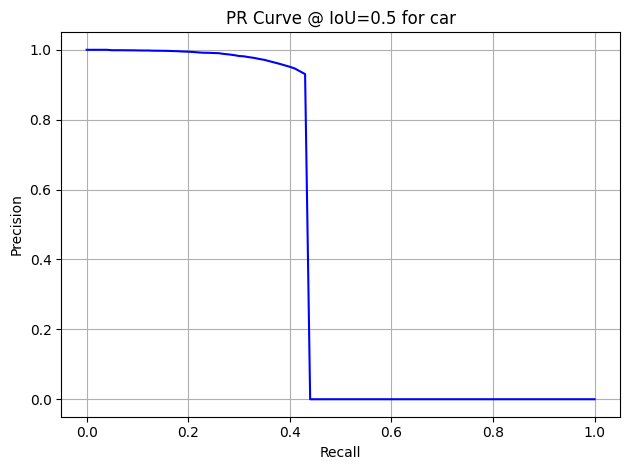

train                | AP@0.5: 0.255 | AP@0.75: 0.150 | mAP@[.5:.95]: 0.170


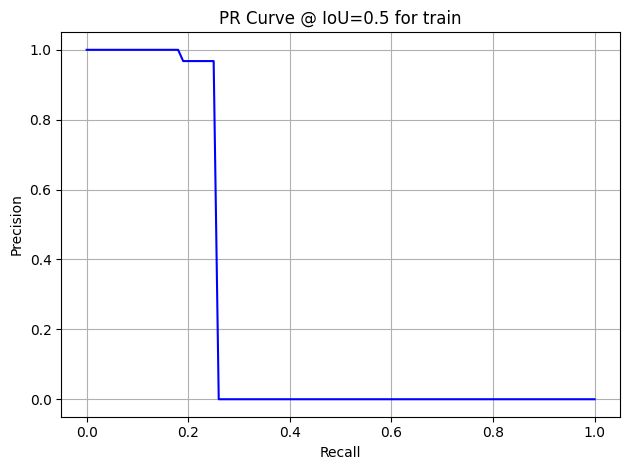

rider                | AP@0.5: 0.206 | AP@0.75: 0.144 | mAP@[.5:.95]: 0.129


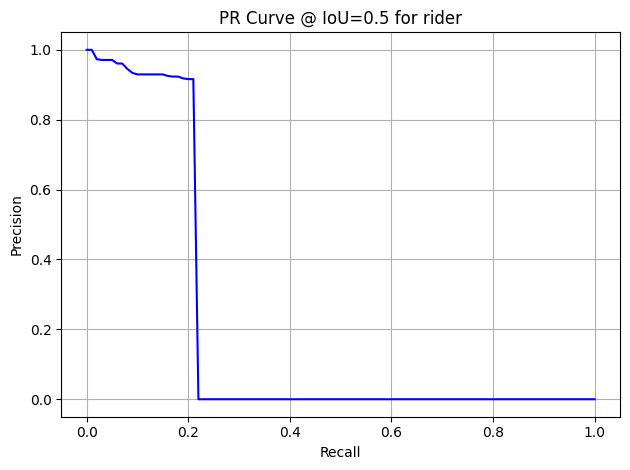

truck                | AP@0.5: 0.077 | AP@0.75: 0.077 | mAP@[.5:.95]: 0.069


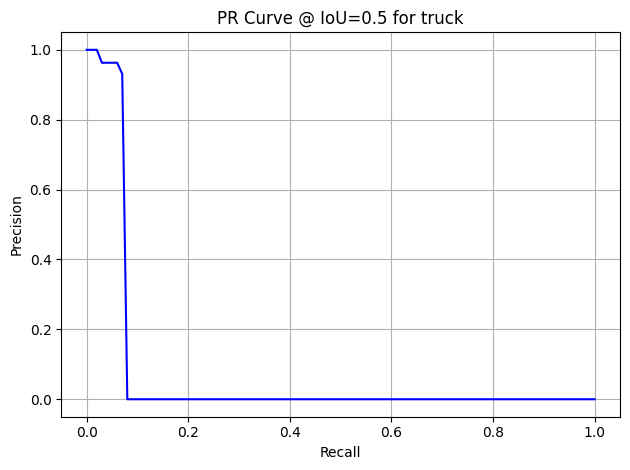

motorcycle           | AP@0.5: 0.178 | AP@0.75: 0.094 | mAP@[.5:.95]: 0.096


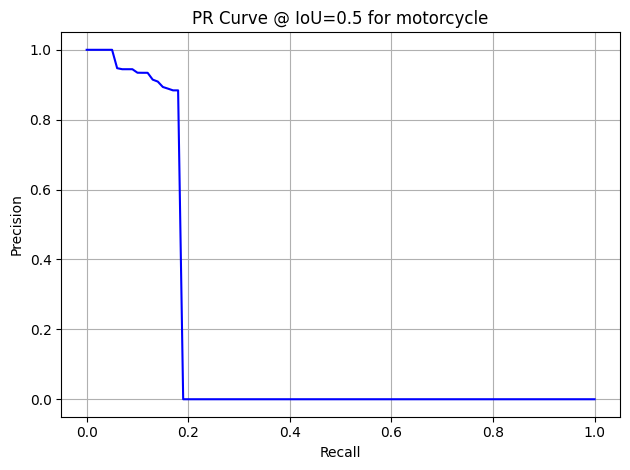

bicycle              | AP@0.5: 0.152 | AP@0.75: 0.073 | mAP@[.5:.95]: 0.081


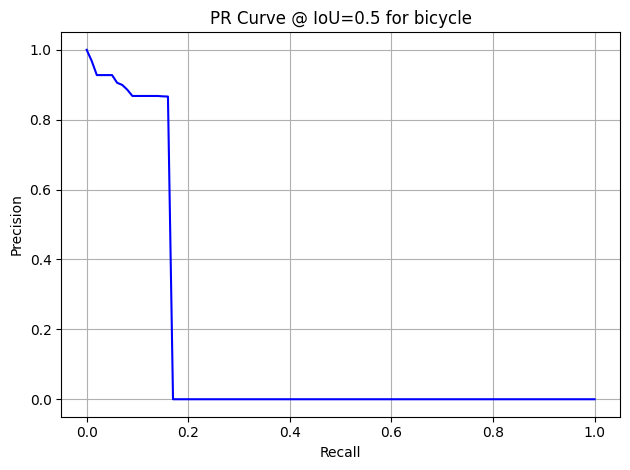

bus                  | AP@0.5: 0.236 | AP@0.75: 0.224 | mAP@[.5:.95]: 0.197


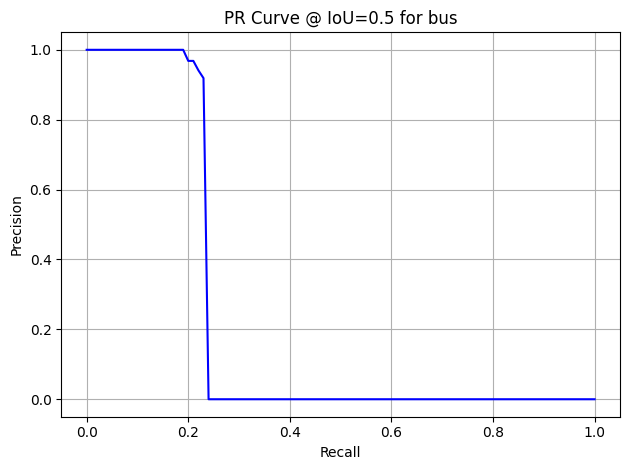

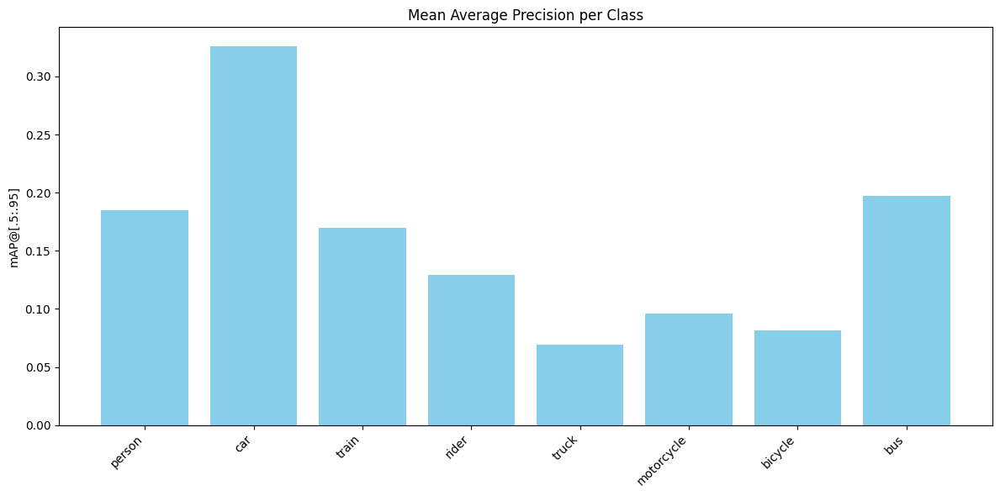

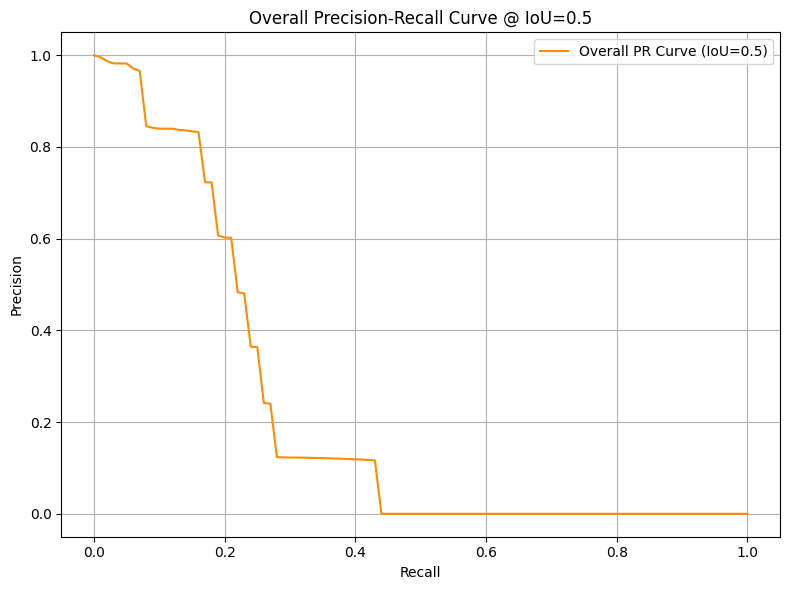

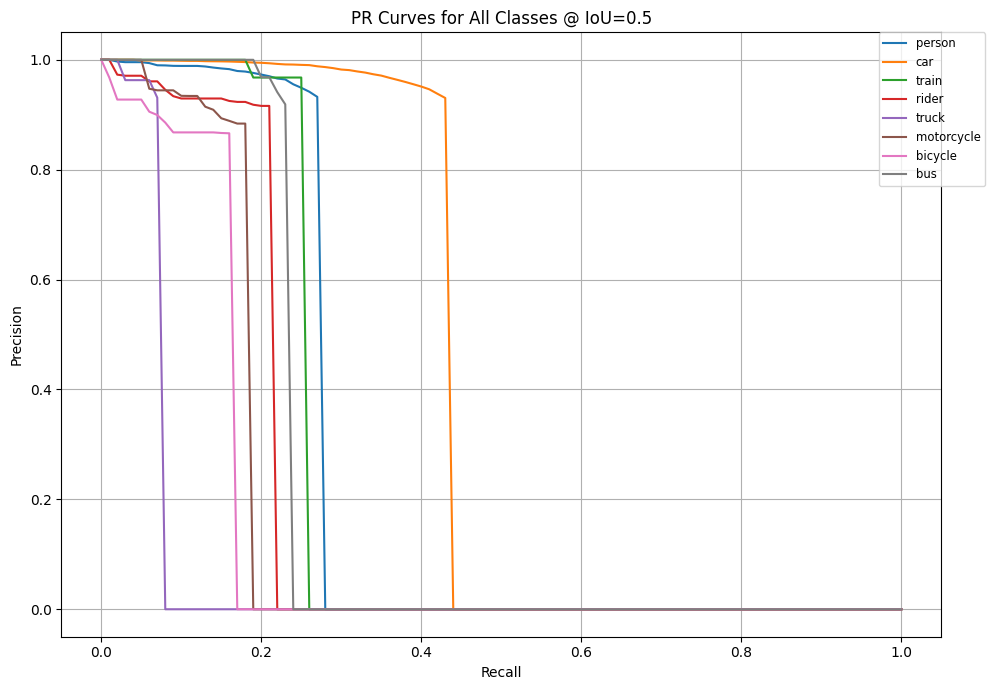

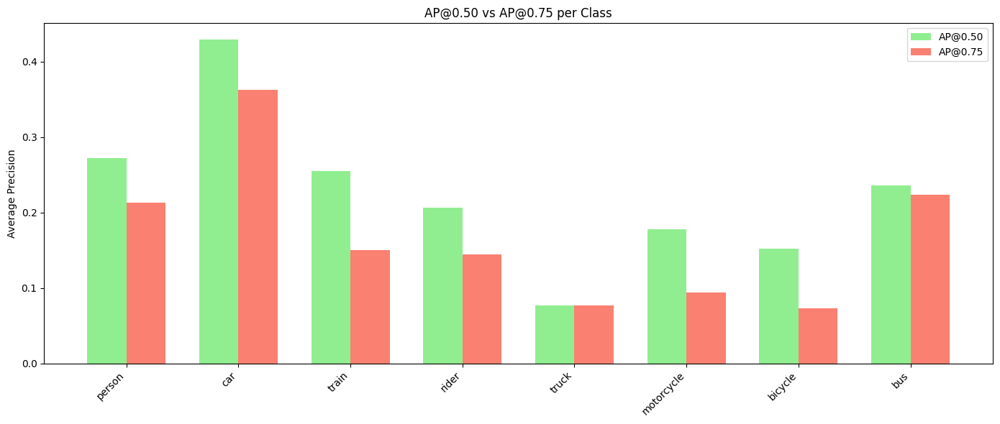

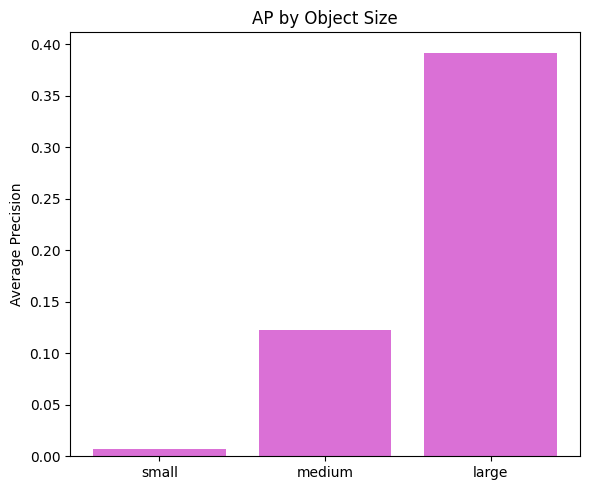

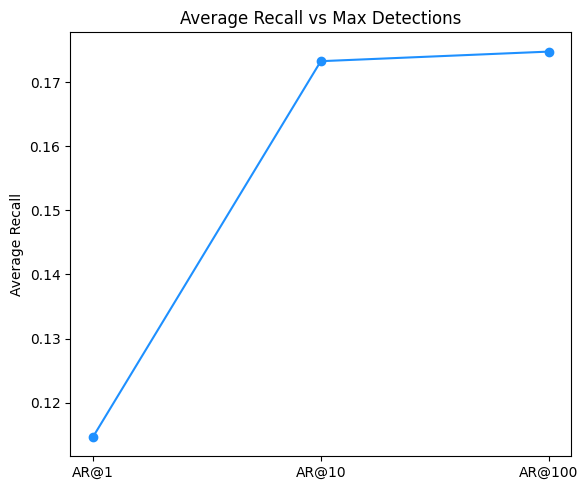


### Overall PR Curves at Multiple IoU Thresholds ###


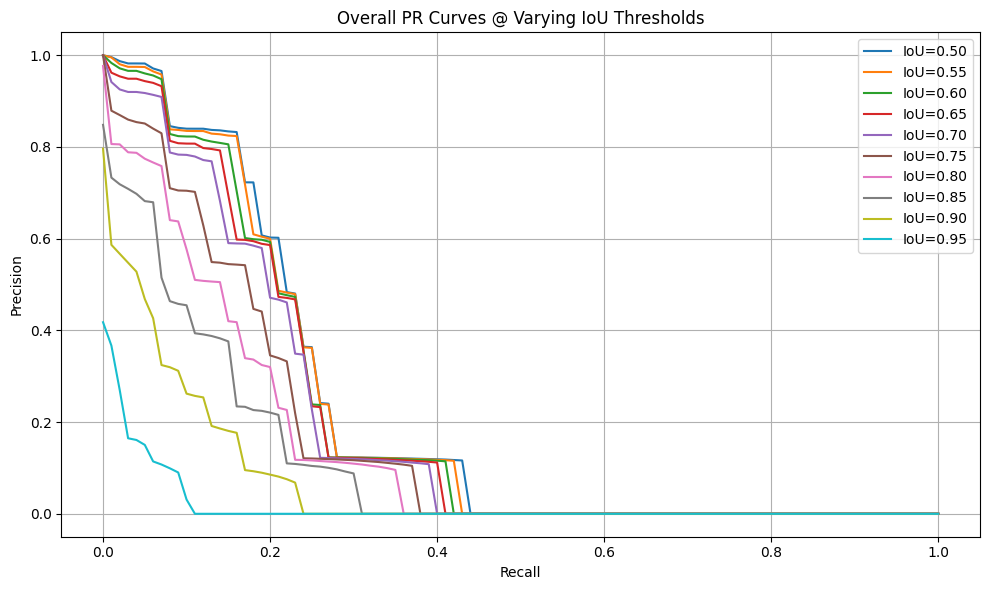

In [16]:
train_coco_pred = train_coco_gt.loadRes(train_save_path)
summarise_and_plot_metrics(train_coco_gt, train_coco_pred, "train_metrics")


--- Evaluating on validation set ---


Running inference:   0%|          | 0/301 [00:00<?, ?it/s]

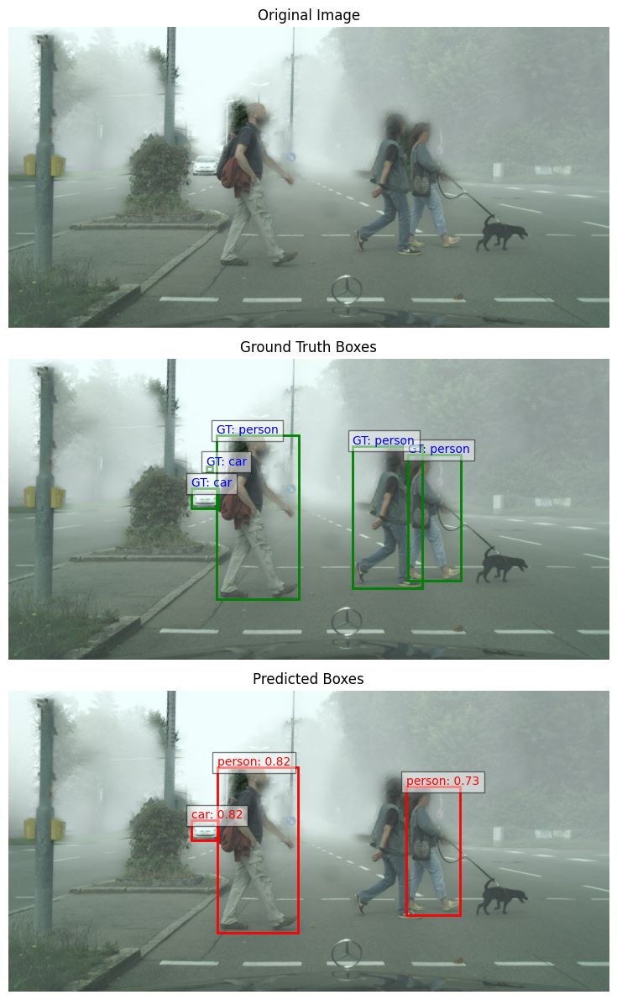

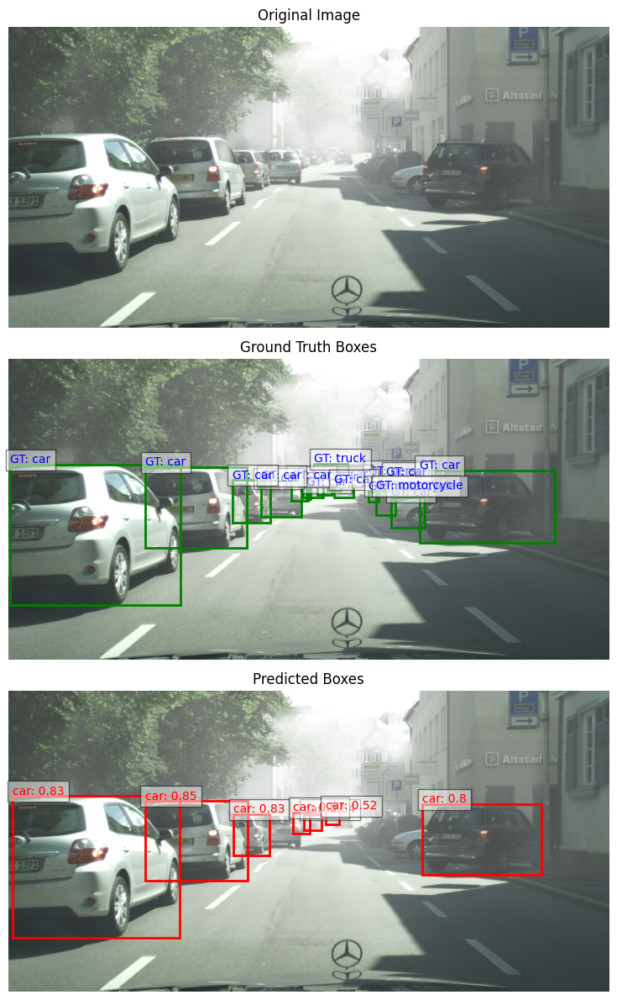

Running inference:   0%|          | 1/301 [00:03<15:45,  3.15s/it]

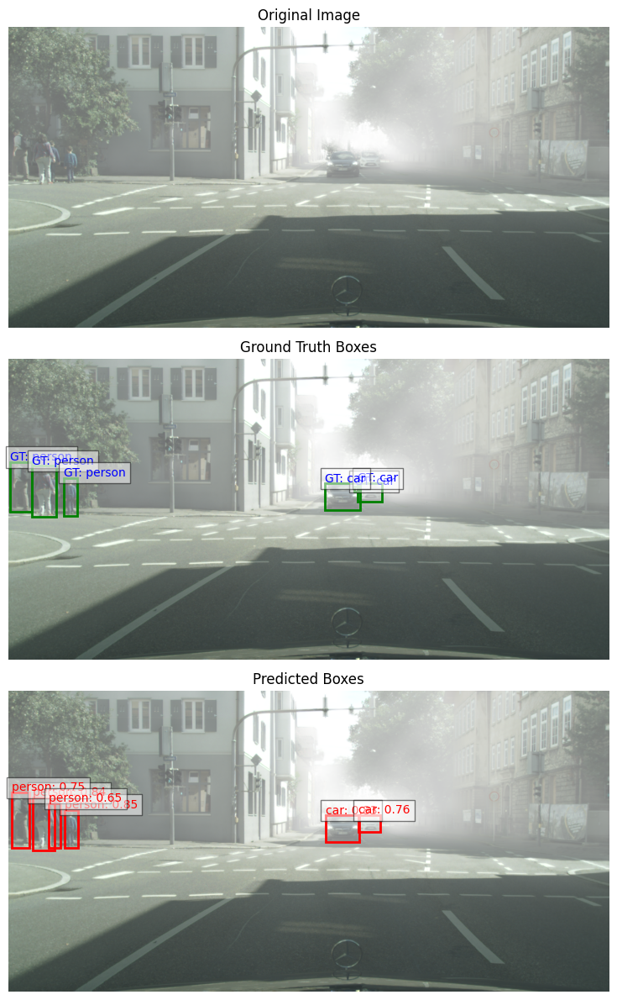

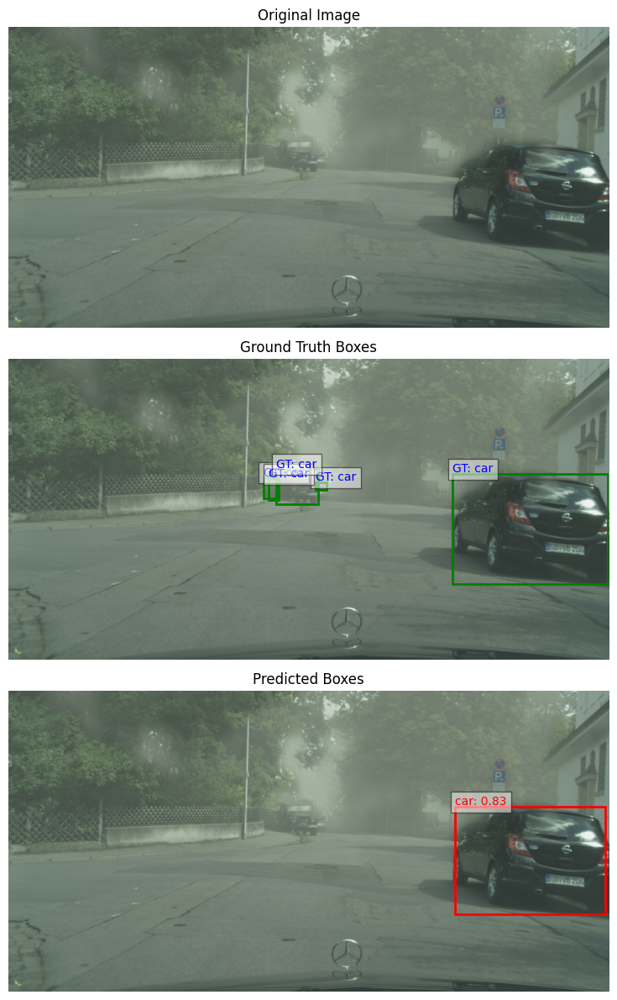

Running inference: 100%|██████████| 301/301 [03:02<00:00,  1.65it/s]


In [17]:
print("\n--- Evaluating on validation set ---")
val_save_path = "val_predictions.json"
model.eval()
with torch.no_grad():
    val_eval = inference(model, val_loader, processor, id_to_cat, val_save_path)

Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.29s).
Accumulating evaluation results...
DONE (t=0.15s).

### COCO Evaluation Summary ###
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.130
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.192
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.136
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.005
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.125
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.335
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.083
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.145
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.146
 Average Recall     (AR) @[ IoU=0.5

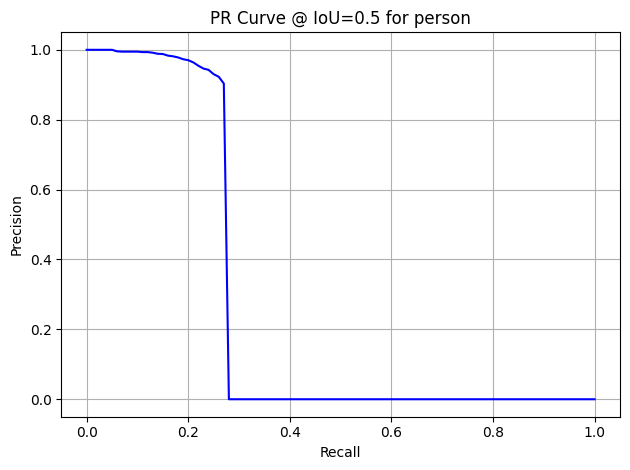

car                  | AP@0.5: 0.438 | AP@0.75: 0.380 | mAP@[.5:.95]: 0.339


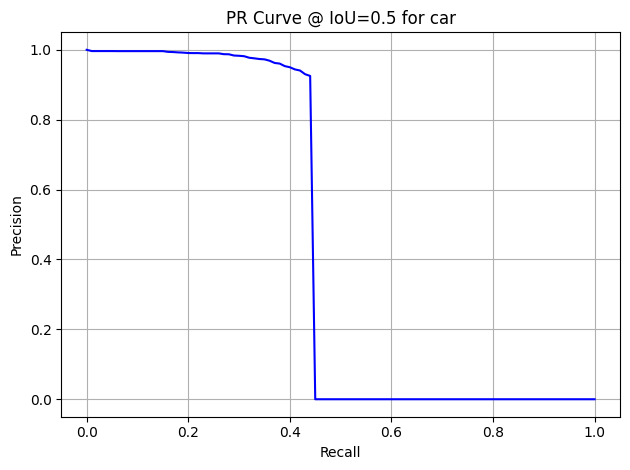

train                | AP@0.5: 0.030 | AP@0.75: 0.000 | mAP@[.5:.95]: 0.015


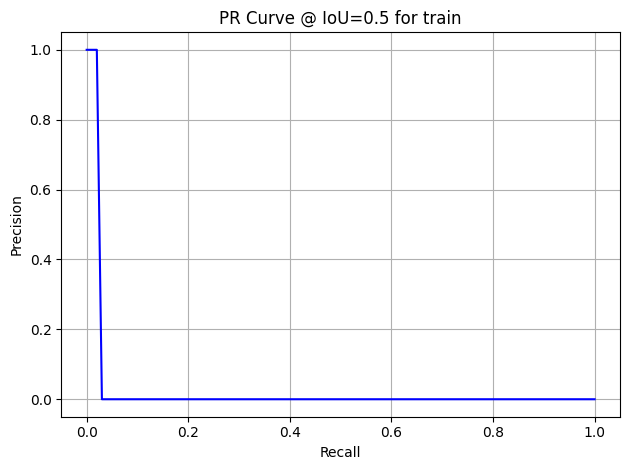

rider                | AP@0.5: 0.180 | AP@0.75: 0.107 | mAP@[.5:.95]: 0.109


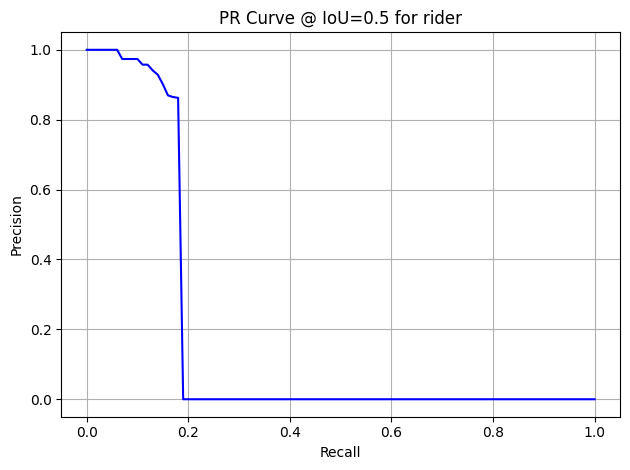

truck                | AP@0.5: 0.069 | AP@0.75: 0.069 | mAP@[.5:.95]: 0.057


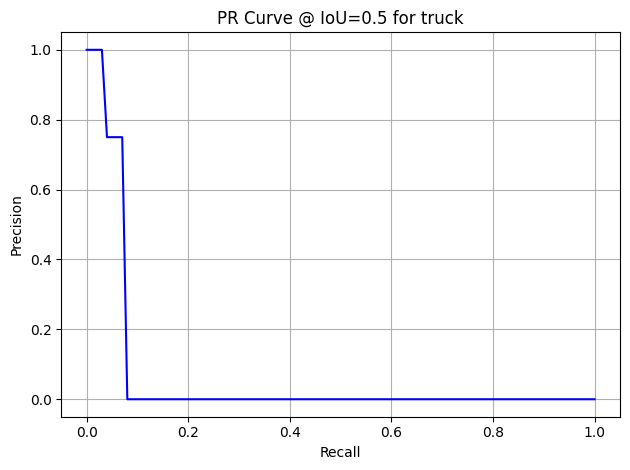

motorcycle           | AP@0.5: 0.229 | AP@0.75: 0.112 | mAP@[.5:.95]: 0.127


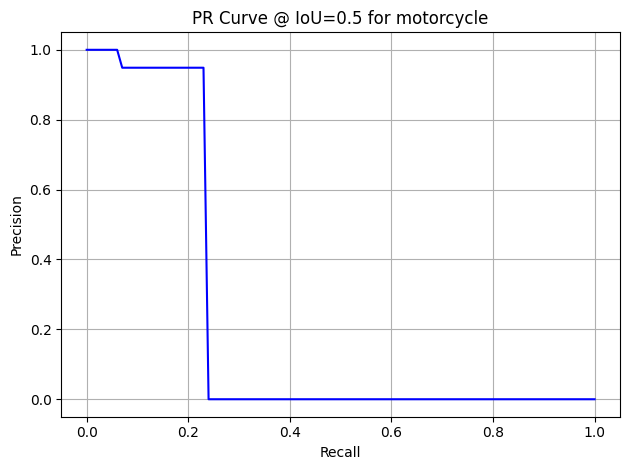

bicycle              | AP@0.5: 0.141 | AP@0.75: 0.056 | mAP@[.5:.95]: 0.069


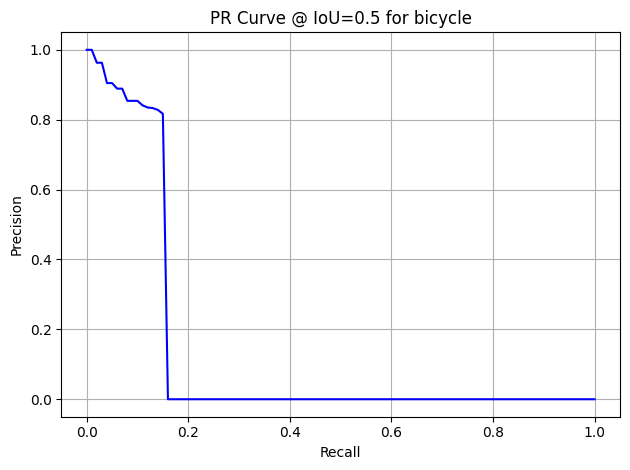

bus                  | AP@0.5: 0.178 | AP@0.75: 0.160 | mAP@[.5:.95]: 0.146


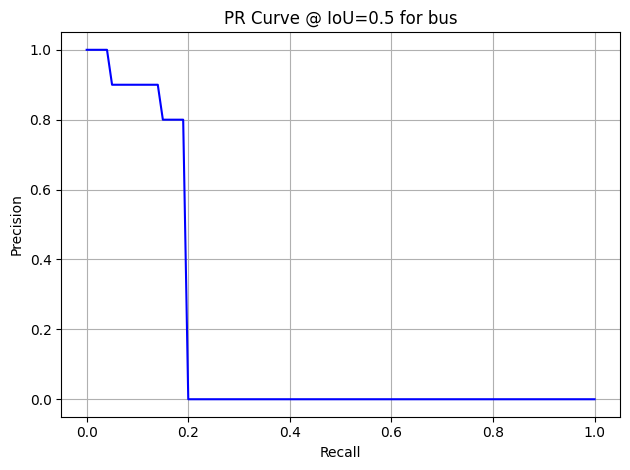

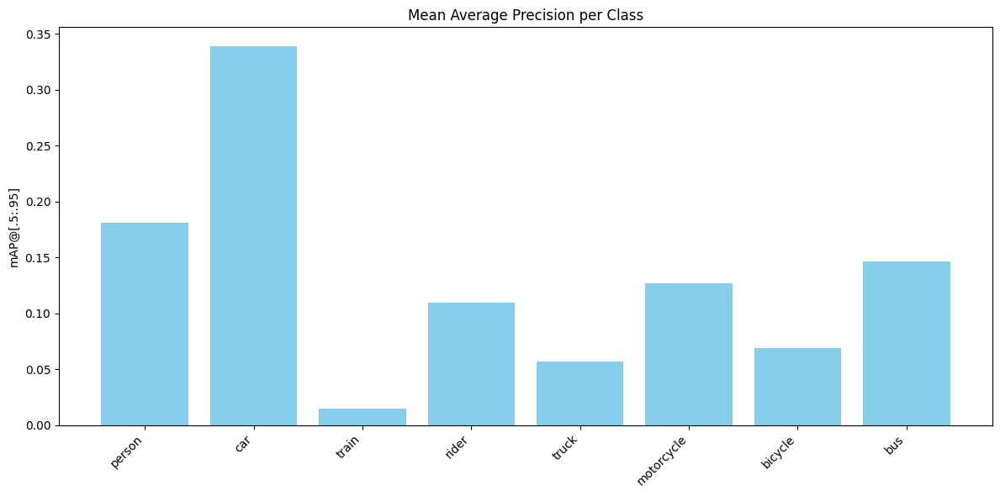

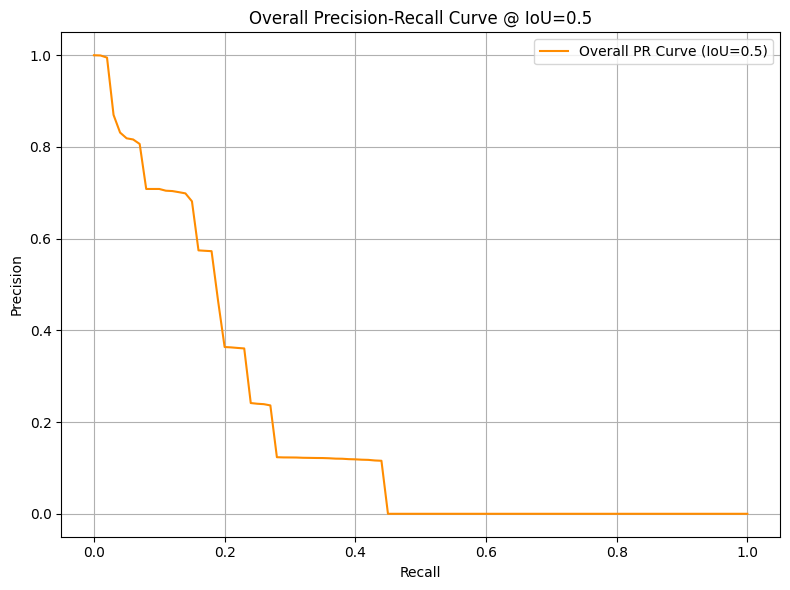

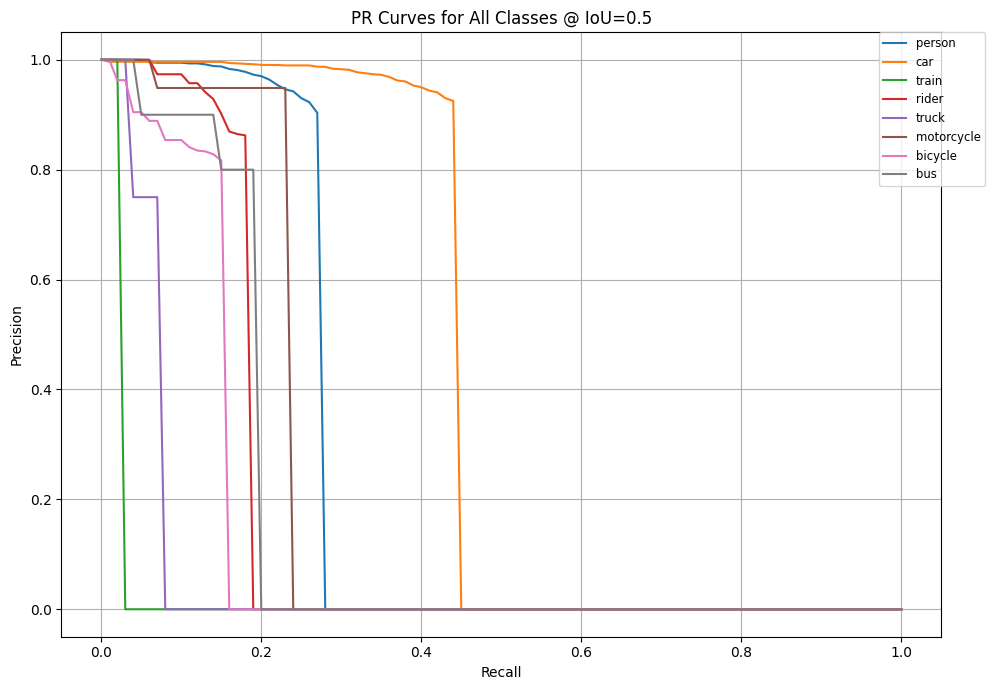

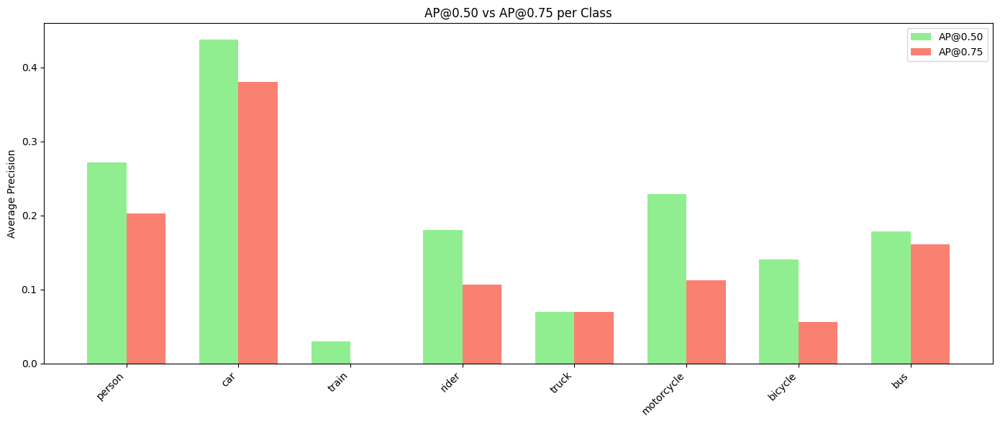

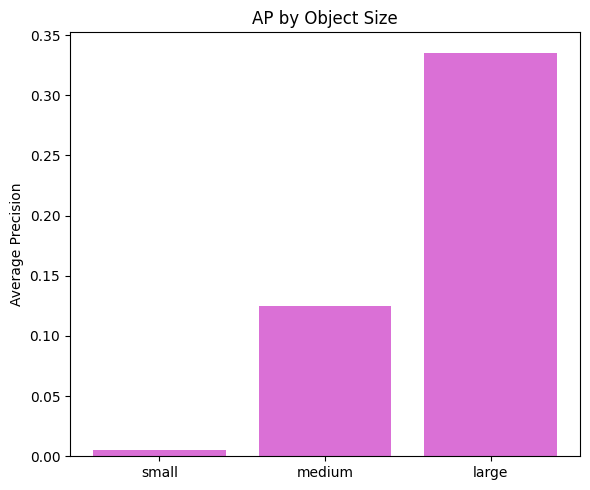

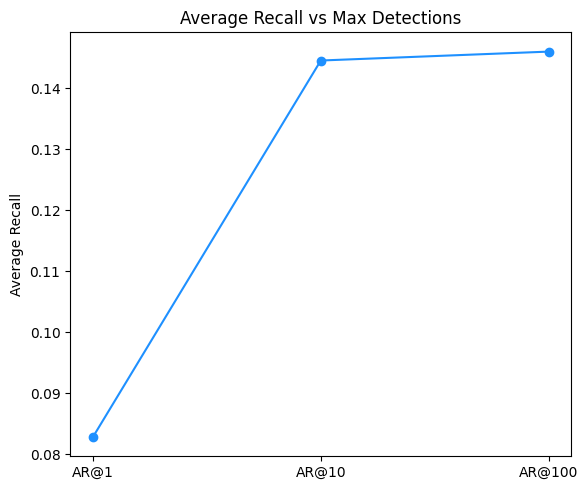


### Overall PR Curves at Multiple IoU Thresholds ###


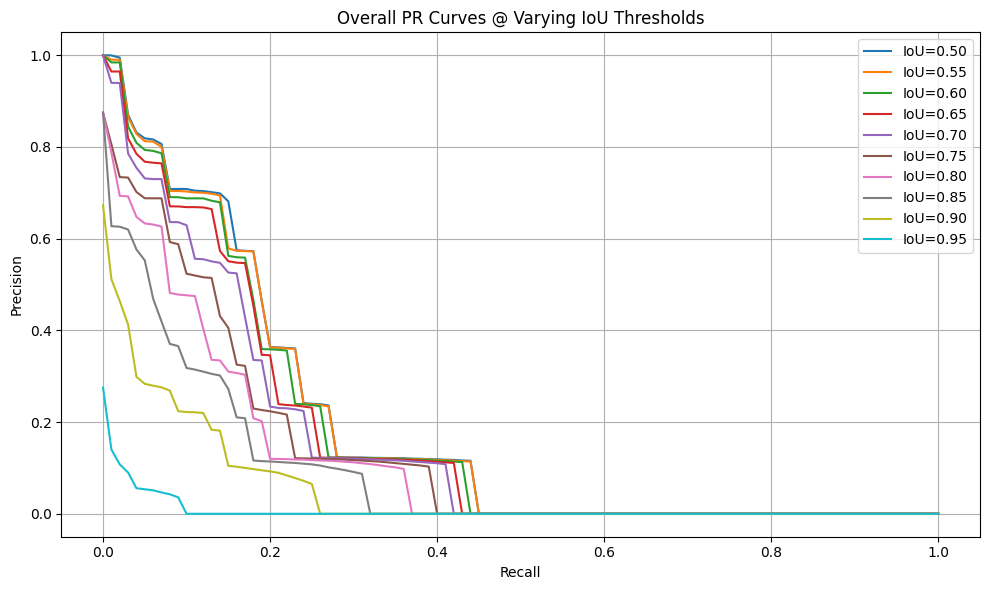

In [18]:
val_coco_pred = val_coco_gt.loadRes(val_save_path)
summarise_and_plot_metrics(val_coco_gt, val_coco_pred, "val_metrics")

In [19]:
print(model)

DeformableDetrForObjectDetection(
  (model): DeformableDetrModel(
    (backbone): DeformableDetrConvModel(
      (conv_encoder): DeformableDetrConvEncoder(
        (model): FeatureListNet(
          (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
          (bn1): DeformableDetrFrozenBatchNorm2d()
          (act1): ReLU(inplace=True)
          (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
          (layer1): Sequential(
            (0): Bottleneck(
              (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
              (bn1): DeformableDetrFrozenBatchNorm2d()
              (act1): ReLU(inplace=True)
              (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
              (bn2): DeformableDetrFrozenBatchNorm2d()
              (drop_block): Identity()
              (act2): ReLU(inplace=True)
              (aa): Identity()
              (conv3):